<a href="https://colab.research.google.com/github/emmanuelvillada573/api/blob/develop/Laboratorio1_DS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Laboratorio # 1

### Temas: Limpieza de Datos, análisis de negocio, integración de fuentes de datos

# 1. El problema del negocio

Una entidad bancaria contrata a una empresa de marketing encargada de contactar telefónicamente a posibles clientes para determinar si están interesados o no en adquirir un certificado de depósito a término con el banco.

¿Qué perfil tienen los clientes con mayor potencial de conversión?

#2. El set de datos

La información recolectada por la empresa de mercadeo se encuentra en un archivo CSV (`dataset_banco.csv`) con 45215 filas y 17 columnas.

Cada registro contiene 16 características (las primeras 16 columnas) y una categoría ("yes" o "no" dependiendo de si la persona está o no interesada en adquirir el producto). Las columnas son:

1. "age":  edad (numérica)
2. "job": tipo de trabajo (categórica: "admin.", "unknown", "unemployed", "management", "housemaid", "entrepreneur", "student", "blue-collar","self-employed", "retired", "technician", "services")
3. "marital": estado civil (categórica: "married", "divorced", "single")
4. "education": nivel educativo (categórica: "unknown", "secondary", "primary", "tertiary")
5. "default": si dejó de pagar sus obligaciones (categórica: "yes", "no")
6. "balance": saldo promedio anual de ingresos en euros (numérica)
7. "housing": ¿tiene o no crédito hipotecario? (categórica: "yes", "no")
8. "loan": ¿tiene créditos de consumo? (categórica: "yes", "no")
9. "contact": medio a través del cual fue contactado (categórica: "unknown", "telephone", "cellular")
10. "day": último día del mes en el que fue contactada (numérica)
11. "month": último mes en el que fue contactada (categórica: "jan", "feb", "mar", ..., "nov", "dec")
12. "duration": duración (en segundos) del último contacto (numérica)
13. "campaign": número total de veces que fue contactada durante la campaña (numérica)
14. "pdays": número de días transcurridos después de haber sido contactado antes de la campaña actual (numérica. -1 indica que no fue contactado previamente)
15. "previous": número de veces que ha sido contactada antes de esta campaña (numérica)
16. "poutcome": resultado de la campaña de marketing anterior (categórica: "unknown", "other", "failure", "success")
17. "y": categoría ¿el cliente se suscribió a un depósito a término? (categórica: "yes", "no")

#3. Una primera mirada al dataset

In [ ]:
# Importar librerías
import pandas as pd
import matplotlib.pyplot as plt #libreria nos permite graficar
import seaborn as sns #libreria nos permite graficar estadistica


In [ ]:
# Carga de datos con autorización de Drive (Opción 1)
from google.colab import drive
drive.mount('/content/drive')

ruta = "/content/drive/MyDrive/Colab Notebooks/DA_Talento/data/dataset_banco.csv"

data = pd.read_csv(ruta)

Mounted at /content/drive


In [ ]:
import os

In [ ]:
# Definir la ruta de la carpeta en Google Drive
folder_path_destino = '/content/drive/MyDrive/Colab Notebooks/DA_Talento/data/'

In [ ]:
# Verificar si la carpeta existe, si no, crearla
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Guardar el archivo CSV en la carpeta
file_path = os.path.join(folder_path, 'data_banco2.csv')
data.to_csv(file_path, index=False)

In [ ]:
# from google.colab import files
# uploaded = files.upload()

Saving dataset_banco.csv to dataset_banco.csv


In [ ]:
#Carga de datos sin autorización de Drive (Opción 2)
#data = pd.read_csv('/content/sample_data/dataset_banco.csv')

In [ ]:
#validación de nombres sin transformación
print(data.shape)
data.head()

(45215, 17)


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143.0,yes,no,unknown,5,may,261.0,1,-1.0,0,unknown,no
1,44,technician,single,secondary,no,29.0,yes,no,unknown,5,may,151.0,1,-1.0,0,unknown,no
2,33,entrepreneur,married,secondary,no,2.0,yes,yes,unknown,5,may,76.0,1,-1.0,0,unknown,no
3,47,blue-collar,married,unknown,no,1506.0,yes,no,unknown,5,may,92.0,1,-1.0,0,unknown,no
4,33,unknown,single,unknown,no,1.0,no,no,unknown,5,may,198.0,1,-1.0,0,unknown,no


In [ ]:
# Renombramos las columnas
data_rename_2 = data.rename(columns={
                                  'age':        'edad',
                                  'job':        'trabajo',
                                  'marital':    'estado_civil',
                                  'education':  'educacion',
                                  'default':    'morosidad',
                                  'balance':    'saldo',
                                  'housing':    'vivienda',
                                  'loan':       'prestamo',
                                  'contact':    'contacto',
                                  'day':        'dia',
                                  'month':      'mes',
                                  'duration':   'duracion',
                                  'campaign':   'campana',
                                  'pdays':      'dias_previos',
                                  'previous':   'anterior',
                                  'poutcome':   'resultado',
                                  'y':          'respuesta'})

# Verificamos los cambios
print(data_rename_2.head())

   edad       trabajo estado_civil  educacion morosidad   saldo vivienda  \
0    58    management      married   tertiary        no  2143.0      yes   
1    44    technician       single  secondary        no    29.0      yes   
2    33  entrepreneur      married  secondary        no     2.0      yes   
3    47   blue-collar      married    unknown        no  1506.0      yes   
4    33       unknown       single    unknown        no     1.0       no   

  prestamo contacto  dia  mes  duracion  campana  dias_previos  anterior  \
0       no  unknown    5  may     261.0        1          -1.0         0   
1       no  unknown    5  may     151.0        1          -1.0         0   
2      yes  unknown    5  may      76.0        1          -1.0         0   
3       no  unknown    5  may      92.0        1          -1.0         0   
4       no  unknown    5  may     198.0        1          -1.0         0   

  resultado respuesta  
0   unknown        no  
1   unknown        no  
2   unknown   

In [ ]:
# Renombrar las columnas
data.columns = ['edad',
              'trabajo',
              'estado_civil',
              'educacion',
              'incumplimiento',
              'saldo',
              'vivienda',
              'prestamo',
              'contacto',
              'dia',
              'mes',
              'duracion',
              'campaña',
              'dias_previos',
              'anterior',
              'resultado_prev',
              'respuesta']

print(data.columns)

Index(['edad', 'trabajo', 'estado_civil', 'educacion', 'incumplimiento',
       'saldo', 'vivienda', 'prestamo', 'contacto', 'dia', 'mes', 'duracion',
       'campaña', 'dias_previos', 'anterior', 'resultado_prev', 'respuesta'],
      dtype='object')


In [ ]:
print(data.shape)
data.head()

(45215, 17)


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143.0,yes,no,unknown,5,may,261.0,1,-1.0,0,unknown,no
1,44,technician,single,secondary,no,29.0,yes,no,unknown,5,may,151.0,1,-1.0,0,unknown,no
2,33,entrepreneur,married,secondary,no,2.0,yes,yes,unknown,5,may,76.0,1,-1.0,0,unknown,no
3,47,blue-collar,married,unknown,no,1506.0,yes,no,unknown,5,may,92.0,1,-1.0,0,unknown,no
4,33,unknown,single,unknown,no,1.0,no,no,unknown,5,may,198.0,1,-1.0,0,unknown,no


In [ ]:
# Veamos las variables categóricas y las numéricas
data = data_rename_2
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45215 entries, 0 to 45214
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   edad          45215 non-null  int64  
 1   trabajo       45213 non-null  object 
 2   estado_civil  45214 non-null  object 
 3   educacion     45214 non-null  object 
 4   morosidad     45215 non-null  object 
 5   saldo         45213 non-null  float64
 6   vivienda      45215 non-null  object 
 7   prestamo      45215 non-null  object 
 8   contacto      45215 non-null  object 
 9   dia           45215 non-null  int64  
 10  mes           45215 non-null  object 
 11  duracion      45214 non-null  float64
 12  campana       45215 non-null  int64  
 13  dias_previos  45214 non-null  float64
 14  anterior      45215 non-null  int64  
 15  resultado     45215 non-null  object 
 16  respuesta     45215 non-null  object 
dtypes: float64(3), int64(4), object(10)
memory usage: 5.9+ MB


**categoricas = data.select_dtypes(include=['object']).columns.tolist()**

Este comando selecciona todas las columnas del DataFrame que tienen el **tipo de datos object**, lo cual usualmente indica **datos categóricos** o de **texto**. Luego, convierte los nombres de estas columnas en una **lista** y los almacena en la variable categoricas.


**numericas = data.select_dtypes(include=['int64', 'float64']).columns.tolist()**

Este comando selecciona todas las columnas del DataFrame que tienen tipos de datos numéricos (**int64** para enteros y **float64** para números decimales). Convierte los nombres de estas columnas en una lista y los almacena en la variable numericas.

In [ ]:
# Clasificar columnas
categoricas = data.select_dtypes(include=['object']).columns.tolist()
numericas = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
print("Columnas categóricas:", categoricas)
print("Columnas numéricas:", numericas)

Columnas categóricas: ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome', 'y']
Columnas numéricas: ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']


In [ ]:
pd.value_counts(data['educacion'])

educacion
secondary    23197
tertiary     13302
primary       6849
unknown       1855
SECONDARY        3
Primary          2
sec.             2
UNK              2
Secondary        1
Tertiary         1
Name: count, dtype: int64

In [ ]:
#cambia los nombres de las columnas del dataframe
#visualiza las primeras líneas de tu .csv
#visualiza las variables categóricas y las numéricas
#proporciona estadísticas descriptivas para columnas numéricas

In [ ]:
data.describe()

,edad,saldo,dia,duracion,campana,dias_previos,anterior
count,45215.000000,45213.000000,45215.000000,45214.000000,45215.000000,45214.000000,45215.000000
mean,41.004711,1374.159866,15.805839,258.074357,2.763729,40.192485,0.580383
std,12.036647,3924.255525,8.322473,257.605175,3.097910,100.120622,2.303438
min,18.000000,-8019.000000,1.000000,-1389.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,776.000000,527532.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


#4. Limpieza

Realizaremos el proceso de limpieza teniendo en cuenta las situaciones más comunes:

1. Datos faltantes en algunas celdas
2. Columnas irrelevantes (que no responden al problema que queremos resolver)
3. Registros (filas) repetidos
4. Valores extremos (*outliers*) en el caso de las variables numéricas. Se deben analizar en detalle pues no necesariamente la solución es eliminarlos
5. Errores tipográficos en el caso de las variables categóricas

Al final de este proceso de limpieza deberíamos tener un set de datos **íntegro**, listo para la fase de Análisis Exploratorio.

## 4.1 Datos faltantes

Acá comenzamos a ver que los datos no están completos, pues no todas las columnas tienen la misma cantidad de registros.

El número total de registros debería ser 45.215. Sin embargo columnas como "job", "marital", "education", "balance", "duration" y "pdays".

Por ser tan pocos los datos  faltantes optaremos por eliminar las filas correspondientes:

In [ ]:
# prompt: contar registros faltantes por columna una especifica

df_faltantes = data['trabajo'].isnull().value_counts()
df_faltantes

trabajo
False    45213
True         2
Name: count, dtype: int64

In [ ]:
data.isna().sum()

age          0
job          2
marital      1
education    1
default      0
balance      2
housing      0
loan         0
contact      0
day          0
month        0
duration     1
campaign     0
pdays        1
previous     0
poutcome     0
y            0
dtype: int64

In [ ]:
data.dropna(inplace=True)
data.count()

age          45207
job          45207
marital      45207
education    45207
default      45207
balance      45207
housing      45207
loan         45207
contact      45207
day          45207
month        45207
duration     45207
campaign     45207
pdays        45207
previous     45207
poutcome     45207
y            45207
dtype: int64

In [ ]:
data.describe()

,edad,saldo,dia,duracion,campana,dias_previos,anterior
count,45207.000000,45207.000000,45207.000000,45207.000000,45207.000000,45207.000000,45207.000000
mean,41.005596,1374.201318,15.806534,258.032539,2.763731,40.178225,0.580198
std,12.037399,3924.491665,8.323015,257.460759,3.098058,100.103283,2.303341
min,18.000000,-8019.000000,1.000000,-1389.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1427.500000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,776.000000,527532.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [ ]:
# prompt: contar la extension de letras en la columna educacion
data['educacion'].apply(len)

0        8
1        9
2        9
3        7
4        7
        ..
45210    8
45211    7
45212    9
45213    9
45214    9
Name: educacion, Length: 45207, dtype: int64

##4.2 Columnas irrelevantes

Una columna irrelevante puede ser:

- **Una columna que no contiene información relevante para el problema que queremos resolver**. Por ejemplo en este caso podría ser una columna que no guarde relación con el posible perfil del cliente (deporte favorito, hobbies, comida favorita, etc.)
- **Una columna categórica pero con un sólo nivel**. Por ejemplo si en la columna "job" solo tuviésemos el nivel "unknown".
- **Una columna numérica pero con un sólo valor**. Por ejemplo si en la columna "edad" todos los valores fuesen iguales a 50.
- **Columnas con información redundante**. Por ejemplo si además de las columnas "month" y "day" tuviésemos la columna "month-day", resultado de combinar las dos anteriores.

Si tenemos la duda de si alguna columna puede ser relevante o no lo mejor es dejarla (y más adelante en posteriores etapas podremos darnos cuenta de si se debe preservar o no).

En este caso todas las columnas pueden resultar relevantes, pero debemos verificar que no haya columnas categóricas con un sólo nivel, o columnas numéricas con un sólo valor:

# **for col in cols_cat:**
Este es un bucle for que itera sobre cada elemento en la lista cols_cat. La variable col tomará el valor de cada elemento en cada iteración del bucle.

print(f'Columna {col}: {data[col].nunique()} subniveles'): Dentro del bucle, esta línea de código imprime un mensaje que indica el nombre de la columna (col), seguido por el número de subniveles únicos en esa columna.

f'Columna {col}: {data[col].nunique()} subniveles': Esta es una cadena de formato (f-string) que contiene dos variables:
{col}: Representa el nombre de la columna actual en la iteración del bucle.
{data[col].nunique()}: Representa el número de subniveles únicos en la columna actual. data[col] selecciona la columna actual del DataFrame y .nunique() calcula el número de valores únicos en esa columna.

In [ ]:
# Conteo de los niveles en las diferentes columnas categóricas
cols_cat = ['job', 'marital', 'education', 'default', 'housing',
       'loan', 'contact', 'month', 'poutcome', 'y']

#ciclo for para contar los únicos subniveles por variable categórica con nunique
for columna in cols_cat:
  print(f'Columna {columna}: {data[columna].nunique()} subniveles')

Columna job: 18 subniveles
Columna marital: 6 subniveles
Columna education: 10 subniveles
Columna default: 2 subniveles
Columna housing: 2 subniveles
Columna loan: 6 subniveles
Columna contact: 5 subniveles
Columna month: 12 subniveles
Columna poutcome: 6 subniveles
Columna y: 2 subniveles


In [ ]:
# Contar la cantidad de subniveles por variable categorica 'job'
pd.value_counts(data['job'])

job
blue-collar       9730
management        9454
technician        7597
admin.            5166
services          4153
retired           2263
self-employed     1578
entrepreneur      1487
unemployed        1303
housemaid         1240
student            938
unknown            288
administrative       3
Management           2
MANAGEMENT           2
Self-employed        1
Services             1
Retired              1
Name: count, dtype: int64

Todas las columnas categóricas tienen más de 1 subnivel. No eliminaremos ninguna.

Verifiquemos lo que ocurre con las columnas numéricas:

Todas las columnas numéricas tienen desviaciones estándar ("std") diferentes de cero, lo que indica que no tienen un único valor.

Preservaremos todas las columnas numéricas.

La **desviación estándar** es una medida que nos indica qué tan dispersos o alejados están los valores de un conjunto de datos respecto a su media o promedio. En otras palabras, nos ayuda a entender cuánto varían los valores individuales de un conjunto de datos con respecto a su valor promedio.

Imagina que tienes un conjunto de datos que representa las alturas de estudiantes en una clase. Si la desviación estándar es baja, significa que la mayoría de los estudiantes tienen alturas muy similares entre sí y cercanas a la altura promedio de la clase. Por otro lado, si la desviación estándar es alta, significa que las alturas de los estudiantes están muy dispersas, algunos son muy altos y otros muy bajos en comparación con la altura promedio.

Entonces, la desviación estándar nos da una idea de la dispersión o variabilidad de los datos alrededor de su promedio. Una desviación estándar baja indica que los datos están más agrupados alrededor del promedio, mientras que una desviación estándar alta indica que los datos están más dispersos o separados del promedio.

In [ ]:
# Calcular la desviación estándar para las columnas numéricas
desviaciones_estandar = data[['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']].std()

# Imprimir las desviaciones estándar
print(desviaciones_estandar)

age           12.037399
balance     3924.491665
day            8.323015
duration     257.460759
campaign       3.098058
pdays        100.103283
previous       2.303341
dtype: float64


In [ ]:
#desviacion estandar para la variable 'pdays'
destd_pdays = data[['pdays']].std()

# Imprimir las desviaciones estándar
print(destd_pdays)

pdays    100.103283
dtype: float64


In [ ]:
# Crear una gráfica de barras para representar las desviaciones estándar
desviaciones_estandar.plot(kind='bar')
plt.title('Desviación Estándar de las Variables Numéricas')
plt.xlabel('Variables')
plt.ylabel('Desviación Estándar')
plt.xticks(rotation=45)
plt.show()

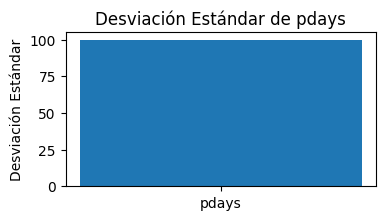

In [ ]:
# Graficar la desviación estándar de 'pdays'
plt.figure(figsize=(4, 2))  # Configura el tamaño de la figura
plt.bar('pdays', destd_pdays)  # Crea una barra para la desviación estándar de 'pdays'
plt.title('Desviación Estándar de pdays')
plt.ylabel('Desviación Estándar')
plt.show()

In [ ]:
#conteo de valores con -1
count = data['pdays'].value_counts()[-1]
print(count)

36953


In [ ]:
# Calcula la media del atributo "pdays: dias de contacto al usuario antes de la campaña actual"
media = data['pdays'].mean()

print("Promedio de dias de contacto:", media)

Promedio de dias de contacto: 40.17822461123277


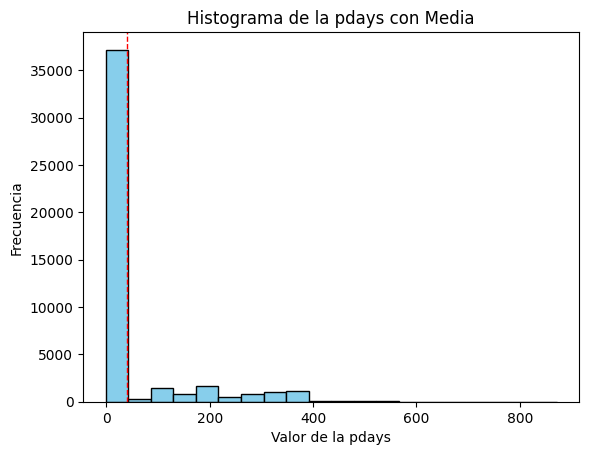

In [ ]:
# Graficar un histograma del atributo "pdays"
plt.hist(data['pdays'], bins=20, color='skyblue', edgecolor='black')

# Agregar una línea vertical para mostrar la media
plt.axvline(media, color='red', linestyle='dashed', linewidth=1)

# Etiquetas y título
plt.xlabel('Valor de la pdays')
plt.ylabel('Frecuencia')
plt.title('Histograma de la pdays con Media')

# Mostrar la gráfica
plt.show()

In [ ]:
# Calcula la desviación estándar del atributo "pdays"
desviacion_estandar = data['pdays'].std()

print("Desviación estándar de la pdays:", desviacion_estandar)

Desviación estándar de la pdays: 100.10328306134589


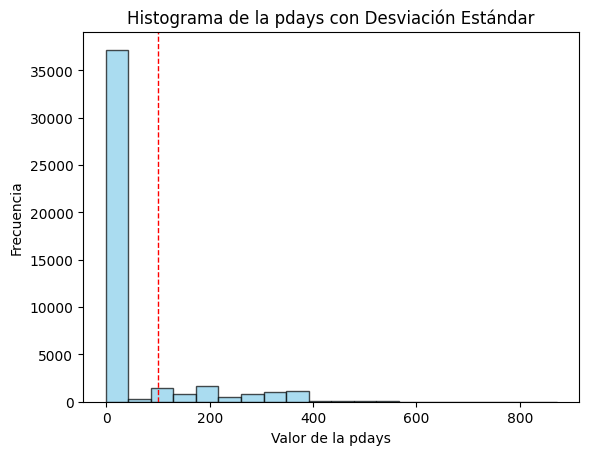

In [ ]:
# Graficar un histograma del atributo "campaña"
plt.hist(data['pdays'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Agregar una línea vertical para mostrar la desviación estándar
plt.axvline(desviacion_estandar, color='red', linestyle='dashed', linewidth=1)

# Etiquetas y título
plt.xlabel('Valor de la pdays')
plt.ylabel('Frecuencia')
plt.title('Histograma de la pdays con Desviación Estándar')

# Mostrar la gráfica
plt.show()


##4.3 Filas repetidas

In [ ]:
#Mostramos la cantidad de registros antes de aplicar una transformación, limpieza o filtro
print(f'Tamaño del set antes de eliminar las filas repetidas: {data.shape}')
data.drop_duplicates(inplace=True)


#Mostramos la cantidad de registros después de aplicar una transformación, limpieza o filtro
print(f'Tamaño del set después de eliminar las filas repetidas: {data.shape}')

Tamaño del set antes de eliminar las filas repetidas: (45207, 17)
Tamaño del set después de eliminar las filas repetidas: (45203, 17)


##4.4 *Outliers* en las variables numéricas

No siempre se deben eliminar los *outliers* porque dependiendo de la variable numérica analizada estos pueden contener información importante.

Creemos gráficas tipo "boxplot" de las columnas numéricas:

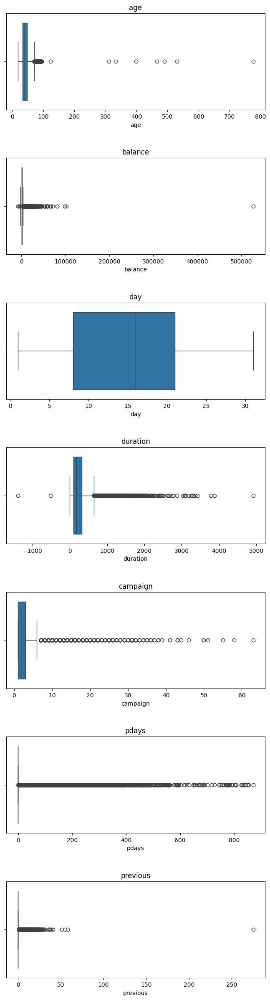

In [ ]:
# Generar gráficas individuales pues las variables numéricas
# están en rangos diferentes
cols_num = ['age', 'balance', 'day', 'duration', 'campaign',
            'pdays', 'previous']

fig, ax = plt.subplots(nrows=7, ncols=1, figsize=(8,30))
fig.subplots_adjust(hspace=0.5)


for i, col in enumerate(cols_num):
    sns.boxplot(x=col, data=data, ax=ax[i])
    ax[i].set_title(col)

**Observaciones:**
- "age": hay sujetos con edades mucho mayores a 100 años
- "duration": hay valores negativos
- "previous": hay un valor extremadamente alto (cercano a 300)

In [ ]:
# Eliminar filas con "age">100
print(f'Tamaño del set antes de eliminar registros de edad: {data.shape}')

data = data.drop(data[data['age'] > 100].index)


print(f'Tamaño del set después de eliminar registros de edad: {data.shape}')

Tamaño del set antes de eliminar registros de edad: (45203, 17)
Tamaño del set después de eliminar registros de edad: (45195, 17)


In [ ]:
# Eliminar filas con "duration"<0
print(f'Tamaño del set antes de eliminar registros de duración: {data.shape}')
data = data.drop(data[data['duration'] < 0].index)
#data = data[data['duration']>0]
print(f'Tamaño del set después de eliminar registros de duración: {data.shape}')

Tamaño del set antes de eliminar registros de duración: (45195, 17)
Tamaño del set después de eliminar registros de duración: (45193, 17)


In [ ]:
# Eliminar filas con "previous">100
print(f'Tamaño del set antes de eliminar registros de previous: {data.shape}')
data = data.drop(data[data['previous'] > 100].index)
#data = data[data['previous']<=100]
print(f'Tamaño del set después de eliminar registros de previous: {data.shape}')

Tamaño del set antes de eliminar registros de previous: (45193, 17)
Tamaño del set después de eliminar registros de previous: (45192, 17)


##4.5 Errores tipográficos en variables categóricas

En una variable categórica pueden aparecer sub-niveles como "unknown" y "UNK" que para nosotros son equivalentes pero que para nuestro programa parecerían diferentes.

Se deben unificar estos sub-niveles

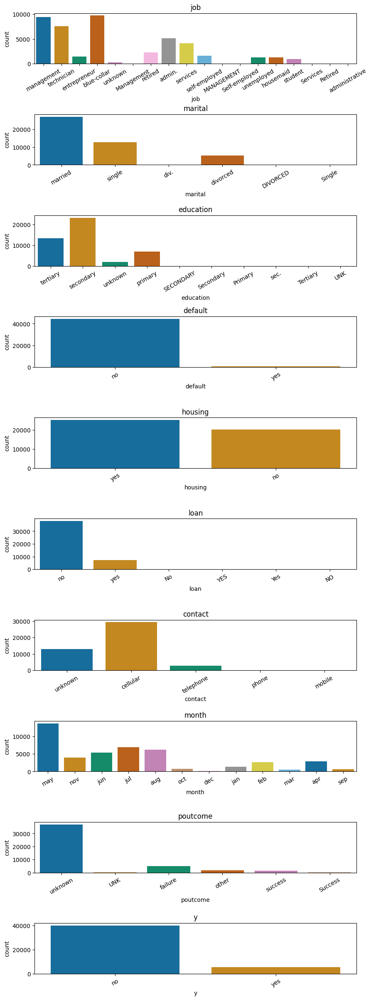

In [ ]:
# Graficar los subniveles de cada variable categórica
cols_cat = ['job', 'marital', 'education', 'default', 'housing',
       'loan', 'contact', 'month', 'poutcome', 'y']

fig, ax = plt.subplots(nrows=10, ncols=1, figsize=(10,30))
fig.subplots_adjust(hspace=1)

for i, col in enumerate(cols_cat):
  sns.countplot(x=col, hue=col, data=data, ax=ax[i], palette= 'colorblind', legend=False)
  ax[i].set_title(col)
  ax[i].tick_params(axis='x', labelrotation=30)

Inicialmente se observa que hay sub-niveles con el mismo nombre pero escritos en minúscula, en mayúscula o con la primera letra en mayúscula.

Unifiquemos estos sub-niveles inicialmente:

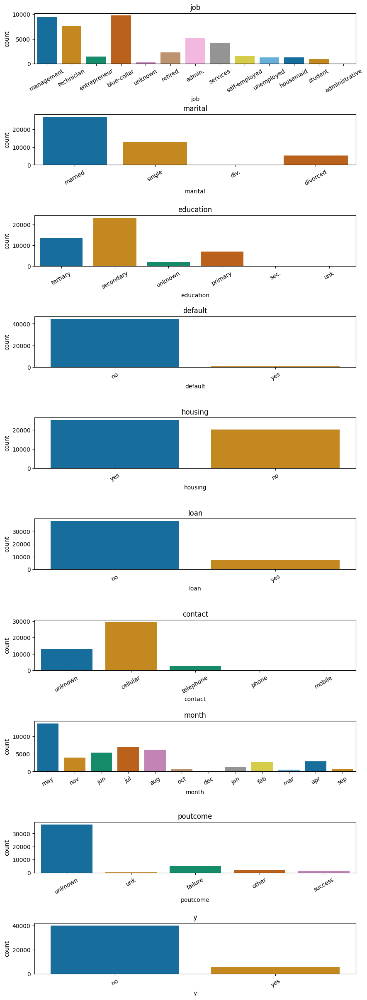

In [ ]:
for column in data.columns:
    # Representar en minúsculas sólo si la columna es categórica
    if column in cols_cat:
        data[column] = data[column].str.lower()

# Y generemos las gráficas nuevamente
fig, ax = plt.subplots(nrows=10, ncols=1, figsize=(10,30))
fig.subplots_adjust(hspace=1)

for i, col in enumerate(cols_cat):
  sns.countplot(x=col, hue=col, data=data, ax=ax[i], palette='colorblind', legend=False)
  ax[i].set_title(col)
  ax[i].tick_params(axis='x', labelrotation=30)

In [ ]:
# job: unificar admin. y administrative
print(data['job'].unique())
data['job'] = data['job'].str.replace('admin.','administrative', regex=False)
print(data['job'].unique())

['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student' 'administrative']
['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'administrative' 'services' 'self-employed' 'unemployed'
 'housemaid' 'student']


In [ ]:
# marital: unificar div. y divorced
print(data['marital'].unique())
data['marital'] = data['marital'].str.replace('div.','divorced', regex=False)
print(data['marital'].unique())

['married' 'single' 'div.' 'divorced']
['married' 'single' 'divorced']


In [ ]:
# education: unificar sec. y secondary, unk y unknown
print(data['education'].unique())
data['education'] = data['education'].str.replace('sec.','secondary', regex=False)

data.loc[data['education']=='unk','education'] = 'unknown'
print(data['education'].unique())

['tertiary' 'secondary' 'unknown' 'primary' 'sec.' 'unk']
['tertiary' 'secondary' 'unknown' 'primary']


In [ ]:
# contact: unificar telephone y phone
print(data['contact'].unique())
data.loc[data['contact']=='phone','contact'] = 'telephone'
data.loc[data['contact']=='mobile','contact'] = 'cellular'
print(data['contact'].unique())

['unknown' 'cellular' 'telephone' 'phone' 'mobile']
['unknown' 'cellular' 'telephone']


In [ ]:
# poutcome: unificar unk y unknown
print(data['poutcome'].unique())
data.loc[data['poutcome']=='unk','poutcome']='unknown'
print(data['poutcome'].unique())

['unknown' 'unk' 'failure' 'other' 'success']
['unknown' 'failure' 'other' 'success']


In [ ]:
data.shape

(45192, 17)

In [ ]:
!pip install pygwalker

In [ ]:
import pygwalker as pyg

In [ ]:
pyg.walk(data)

Box(children=(HTML(value='<div id="ifr-pyg-00061bb49e4947a9z3kNtoFnbOwCHSxG" style="height: auto">\n    <head>…

ERROR: kanaries_api_key is not valid.
Please set kanaries_api_key first.
If you are not kanaries user, please register it from 'https://kanaries.net/home/access' 
Then refer 'https://github.com/Kanaries/pygwalker/wiki/How-to-get-api-key-of-kanaries%3F' to set kanaries_api_key. 

ERROR:pygwalker.services.cloud_service:kanaries_api_key is not valid.
Please set kanaries_api_key first.
If you are not kanaries user, please register it from 'https://kanaries.net/home/access' 
Then refer 'https://github.com/Kanaries/pygwalker/wiki/How-to-get-api-key-of-kanaries%3F' to set kanaries_api_key. 

ERROR: kanaries_api_key is not valid.
Please set kanaries_api_key first.
If you are not kanaries user, please register it from 'https://kanaries.net/home/access' 
Then refer 'https://github.com/Kanaries/pygwalker/wiki/How-to-get-api-key-of-kanaries%3F' to set kanaries_api_key. 

ERROR:pygwalker.services.cloud_service:kanaries_api_key is not valid.
Please set kanaries_api_key first.
If you are not kanaries

¡Y listo, ya hemos realizado la limpieza de nuestro set de datos!

Originalmente tenía 45.215 registros y 17 columnas. El dataset resultante tiene 45.192 filas (23 menos) y 17 columnas.

El set de datos ya está listo para el Análisis Exploratorio.

In [ ]:
#ruta = "/content/drive/MyDrive/Colab Notebooks/DA_Talento/data/data_clean/dataset_banco_clean.csv"
#data.to_csv(ruta, index=False)


#Taller
Resuelve las siguientes preguntas de negocio

In [ ]:
#Edad(age) promedio(mean) de los clientes interesados en adquirir un certificado de depósito(y)
edad_promedio_interesados = data[data['y'] == 'yes']['age'].mean()
print("1. Edad promedio de los clientes interesados:", edad_promedio_interesados)


1. Edad promedio de los clientes interesados: 41.665468306527906


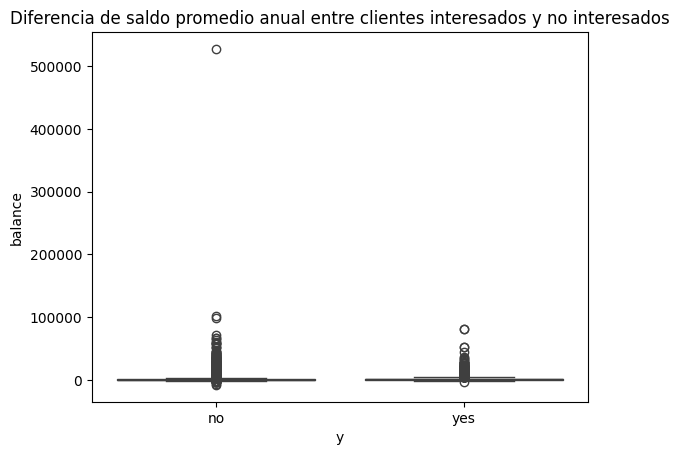

In [ ]:
#Diferencia de ingresos entre clientes interesados y no interesados:
sns.boxplot(x='y', y='balance', data=data)
plt.title('Diferencia de saldo promedio anual entre clientes interesados y no interesados')
plt.show()


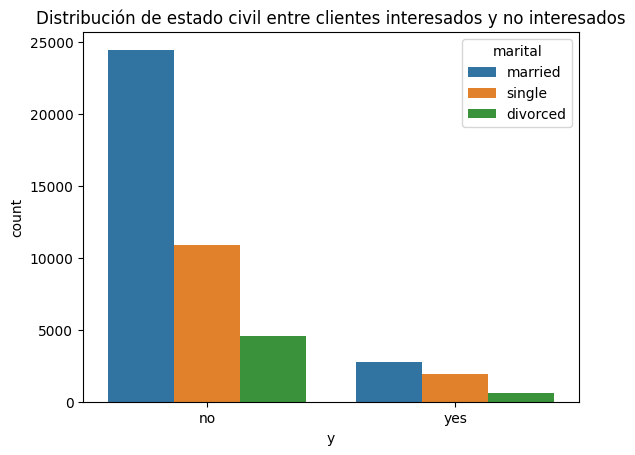

In [ ]:
#Distribución de estado civil entre clientes interesados:
sns.countplot(x='y', hue='marital', data=data)
plt.title('Distribución de estado civil entre clientes interesados y no interesados')
plt.show()


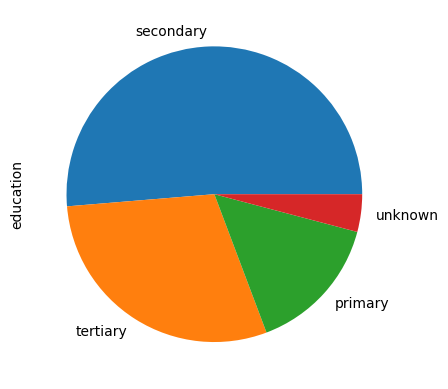

In [ ]:
#Grafico de torta o circular para representar el nivel de educación de los encuestados
data.education.value_counts().plot.pie()
plt.show()

In [ ]:
data.education.describe()

count         45192
unique            4
top       secondary
freq          23189
Name: education, dtype: object

In [ ]:
contar_educacion = data.education.value_counts()
print(contar_educacion)

secondary    23189
tertiary     13298
primary       6848
unknown       1857
Name: education, dtype: int64


In [ ]:
plot2 = contar_educacion.plot.pie(subplots=True, figsize=(9, 4))

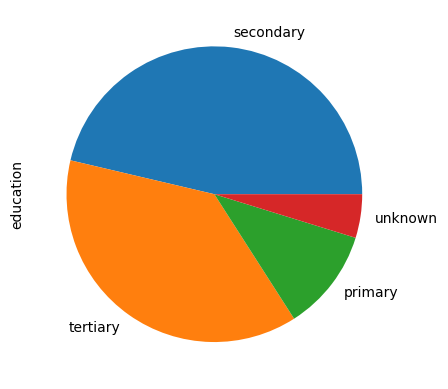

In [ ]:
#Grafique el nivel de educación de los interesados en el producto banco
level_education = data[data['y'] == 'yes'].education.value_counts().plot.pie()

In [ ]:
plot2 = data[data['y'] == 'yes'].education.value_counts().plot.pie(subplots=True)

In [ ]:
#para crear un subplot sobre una variable de tipo numerico, debo tener en esa variable
#otras caracteristicas
#ejemplo: education tiene 4 subniveles, y a su vez estos subniveles tengan valores por caracteristicas
#education: level->primary ->cant:1500
#education: secundary->primary ->cant:1500
#education: tertiary->primary ->cant:1500

In [ ]:
import pandas as pd
data_education = pd.DataFrame({'level': [5, 10, 20],
                            'cant': [2439, 4325, 563]},
                   index=['Primary', 'Secundary', 'Tertiary'])
plot = data_education.plot.pie(y='level', figsize=(5, 5))
print(data_education)

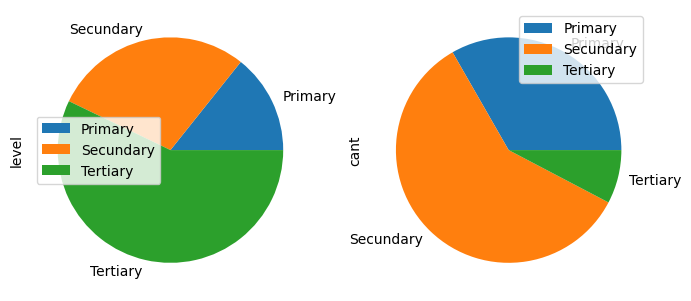

In [ ]:
plot = data_education.plot.pie(subplots=True, figsize=(8, 10))

In [ ]:
data = pd.DataFrame({'mass': [0.330, 4.87 , 5.97],
                   'radius': [2439.7, 6051.8, 6378.1]},
                   index=['Mercury', 'Venus', 'Earth'])
plot = data.plot.pie(y='mass', figsize=(5, 5))
print(data)

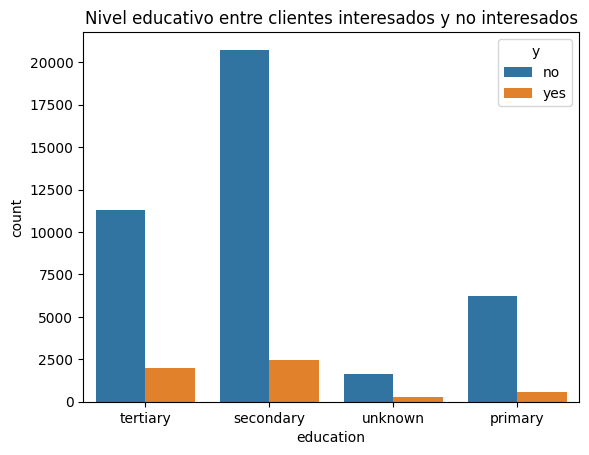

In [ ]:
#Nivel educativo predominante entre clientes interesados:
sns.countplot(x='education', hue='y', data=data)
plt.title('Nivel educativo entre clientes interesados y no interesados')
plt.show()

In [ ]:
#Proporción de clientes con hipotecas pendientes interesados en el producto:
proporcion_hipoteca_interesados = data[(data['housing'] == 'yes') & (data['y'] == 'yes')].shape[0] / data[data['housing'] == 'yes'].shape[0]
print("5. Proporción de clientes con hipotecas pendientes interesados:", proporcion_hipoteca_interesados)
plt.show()


5. Proporción de clientes con hipotecas pendientes interesados: 0.07703326436415725


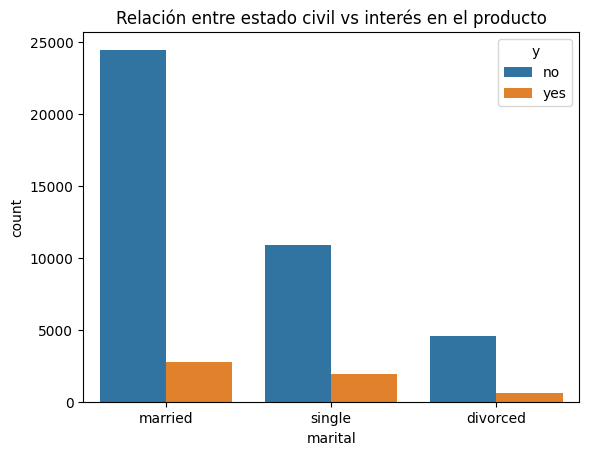

In [ ]:
#Relación entre estado civil vs interés en adquirir el certificado de depósito:
sns.countplot(x='marital', hue='y', data=data)
plt.title('Relación entre estado civil vs interés en el producto')
plt.show()

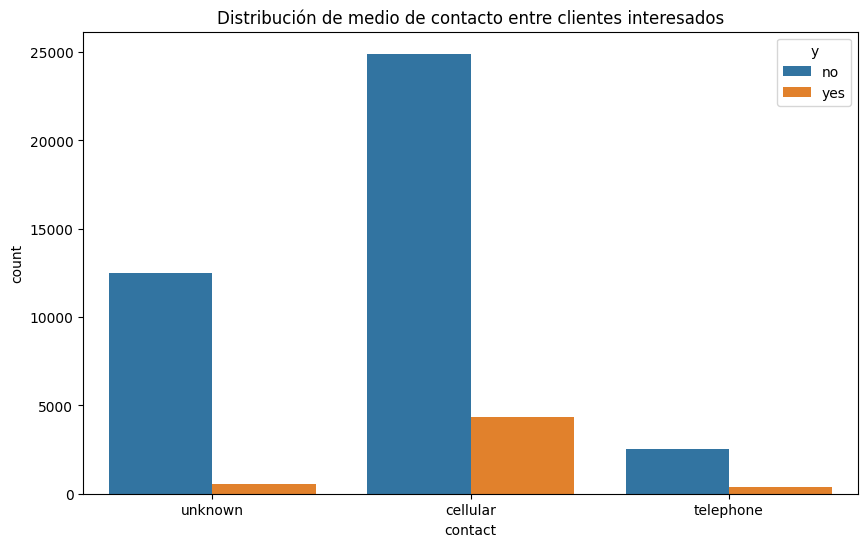

In [ ]:
#Distribución medio de contacto de los clientes interesados:
plt.figure(figsize=(10, 6))
sns.countplot(x='contact', hue='y', data=data)
plt.title('Distribución de medio de contacto entre clientes interesados')
plt.show()


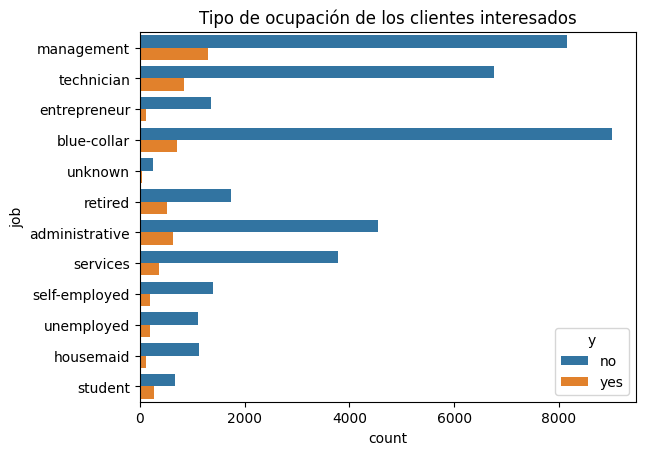

In [ ]:
#Tipo de ocupación de los clientes interesados:
sns.countplot(y='job', hue='y', data=data)
plt.title('Tipo de ocupación de los clientes interesados')
plt.show()

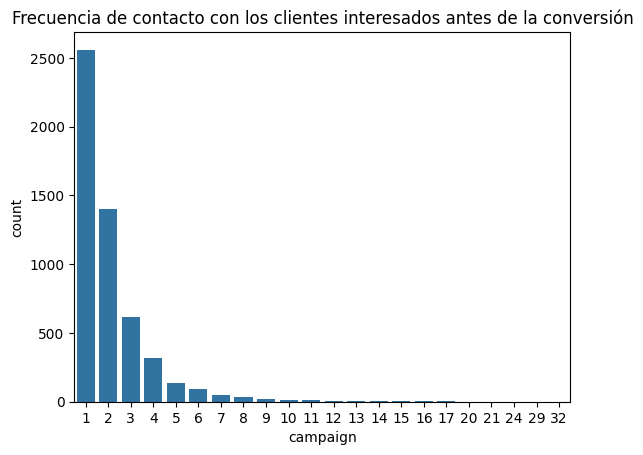

In [ ]:
#Frecuencia de contacto con los clientes interesados antes de la conversión:
sns.countplot(x='campaign', data=data[data['y'] == 'yes'])
plt.title('Frecuencia de contacto con los clientes interesados antes de la conversión')
plt.show()

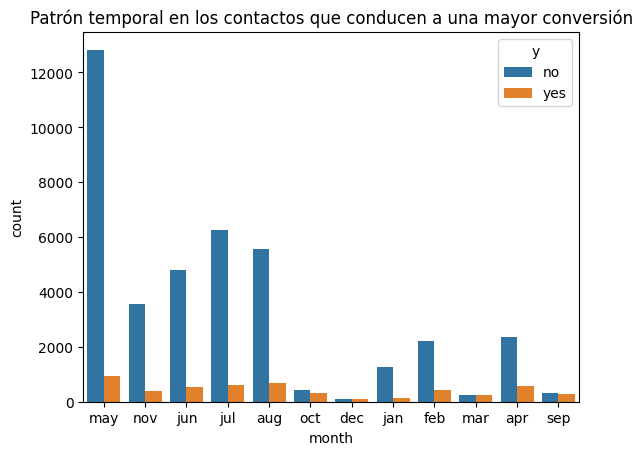

In [ ]:
#Patrón temporal en los contactos que conducen a una mayor conversión de clientes:
sns.countplot(x='month', hue='y', data=data)
plt.title('Patrón temporal en los contactos que conducen a una mayor conversión')
plt.show()


<ipython-input-37-4ac6fd3858ef>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data.groupby('marital').mean().plot.bar()


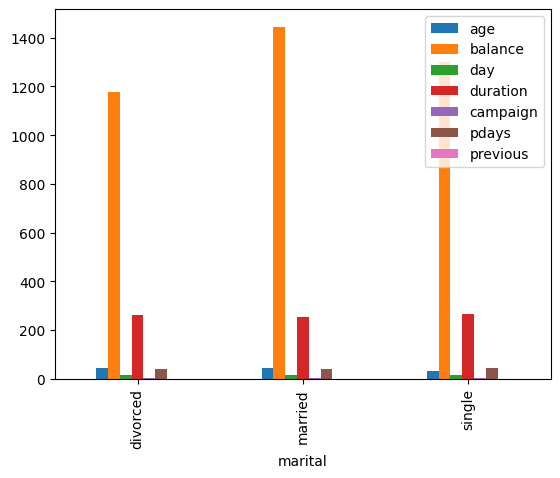

In [ ]:

data.groupby('marital').mean().plot.bar()
plt.show()